In [2]:
import os

os.environ['KERAS_BACKEND'] = 'tensorflow'

from keras.models import Sequential
from keras.layers.core import Flatten, Dense, Dropout, Reshape, Lambda
from keras.layers.convolutional import Conv2D, Convolution2D, MaxPooling2D, ZeroPadding2D
from keras.optimizers import SGD
import tensorflow as tf
from keras import backend as K
from IPython.display import SVG
from keras.utils.vis_utils import model_to_dot
from keras.layers import LeakyReLU
from keras.layers import Input, Dense
from keras.models import Model
import matplotlib.pyplot as plt
from keras.callbacks import TensorBoard, EarlyStopping, ModelCheckpoint
import copy
import cv2
import numpy as np
from random import shuffle
get_ipython().magic(u'matplotlib inline')

# os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"
# os.environ["CUDA_VISIBLE_DEVICES"]="1"

BIN, OVERLAP = 2, 0.1
W = 1.
ALPHA = 1.
MAX_JIT = 3
NORM_H, NORM_W = 224, 224
VEHICLES = ['Car', 'Truck', 'Van', 'Tram']
BATCH_SIZE = 8


label_dir = 'training/label_2/'
image_dir = 'training/image_2/'

C:\Users\alimu\AppData\Local\Temp\ipykernel_1408\1311472122.py:22: DeprecationWarning: `magic(...)` is deprecated since IPython 0.13 (warning added in 8.1), use run_line_magic(magic_name, parameter_s).
  get_ipython().magic(u'matplotlib inline')


In [3]:
# Data Pre Processing
def compute_anchors(angle):
    anchors = []
    
    wedge = 2.*np.pi/BIN
    l_index = int(angle/wedge)
    r_index = l_index + 1
    
    if (angle - l_index*wedge) < wedge/2 * (1+OVERLAP/2):
        anchors.append([l_index, angle - l_index*wedge])
        
    if (r_index*wedge - angle) < wedge/2 * (1+OVERLAP/2):
        anchors.append([r_index%BIN, angle - r_index*wedge])
        
    return anchors

def compute_angle(anchors):
    pass

def parse_annotation(label_dir, image_dir):
    all_objs = []
    dims_avg = {key:np.array([0, 0, 0]) for key in VEHICLES}
    dims_cnt = {key:0 for key in VEHICLES}
        
    for label_file in os.listdir(label_dir):
        image_file = label_file.replace('txt', 'png')

        for line in open(label_dir + label_file).readlines():
            line = line.strip().split(' ')
            truncated = np.abs(float(line[1]))
            occluded  = np.abs(float(line[2]))

            if line[0] in VEHICLES and truncated < 0.1 and occluded < 0.1:
                new_alpha = float(line[3]) + np.pi/2.
                if new_alpha < 0:
                    new_alpha = new_alpha + 2.*np.pi
                new_alpha = new_alpha - int(new_alpha/(2.*np.pi))*(2.*np.pi)

                obj = {'name':line[0],
                       'image':image_file,
                       'xmin':int(float(line[4])),
                       'ymin':int(float(line[5])),
                       'xmax':int(float(line[6])),
                       'ymax':int(float(line[7])),
                       'dims':np.array([float(number) for number in line[8:11]]),
                       'new_alpha': new_alpha
                      }
                
                dims_avg[obj['name']]  = dims_cnt[obj['name']]*dims_avg[obj['name']] + obj['dims']
                dims_cnt[obj['name']] += 1
                dims_avg[obj['name']] /= dims_cnt[obj['name']]

                all_objs.append(obj)
            
    return all_objs, dims_avg

all_objs, dims_avg = parse_annotation(label_dir, image_dir)

for obj in all_objs:
    # Fix dimensions
    obj['dims'] = obj['dims'] - dims_avg[obj['name']]
    
    # Fix orientation and confidence for no flip
    orientation = np.zeros((BIN,2))
    confidence = np.zeros(BIN)
    
    anchors = compute_anchors(obj['new_alpha'])
    
    for anchor in anchors:
        orientation[anchor[0]] = np.array([np.cos(anchor[1]), np.sin(anchor[1])])
        confidence[anchor[0]] = 1.
        
    confidence = confidence / np.sum(confidence)
        
    obj['orient'] = orientation
    obj['conf'] = confidence
        
    # Fix orientation and confidence for flip
    orientation = np.zeros((BIN,2))
    confidence = np.zeros(BIN)
    
    anchors = compute_anchors(2.*np.pi - obj['new_alpha'])
    
    for anchor in anchors:
        orientation[anchor[0]] = np.array([np.cos(anchor[1]), np.sin(anchor[1])])
        confidence[anchor[0]] = 1
        
    confidence = confidence / np.sum(confidence)
        
    obj['orient_flipped'] = orientation
    obj['conf_flipped'] = confidence

def prepare_input_and_output(train_inst):
    ### Prepare image patch
    xmin = train_inst['xmin'] #+ np.random.randint(-MAX_JIT, MAX_JIT+1)
    ymin = train_inst['ymin'] #+ np.random.randint(-MAX_JIT, MAX_JIT+1)
    xmax = train_inst['xmax'] #+ np.random.randint(-MAX_JIT, MAX_JIT+1)
    ymax = train_inst['ymax'] #+ np.random.randint(-MAX_JIT, MAX_JIT+1)
    
    img = cv2.imread(image_dir + train_inst['image'])
    img = copy.deepcopy(img[ymin:ymax+1,xmin:xmax+1]).astype(np.float32)
    
    # re-color the image
    #img += np.random.randint(-2, 3, img.shape).astype('float32')
    #t  = [np.random.uniform()]
    #t += [np.random.uniform()]
    #t += [np.random.uniform()]
    #t = np.array(t)

    #img = img * (1 + t)
    #img = img / (255. * 2.)

    # flip the image
    flip = np.random.binomial(1, .5)
    if flip > 0.5: img = cv2.flip(img, 1)
        
    # resize the image to standard size
    img = cv2.resize(img, (NORM_H, NORM_W))
    img = img - np.array([[[103.939, 116.779, 123.68]]])
    #img = img[:,:,::-1]
    
    ### Fix orientation and confidence
    if flip > 0.5:
        return img, train_inst['dims'], train_inst['orient_flipped'], train_inst['conf_flipped']
    else:
        return img, train_inst['dims'], train_inst['orient'], train_inst['conf']

def data_gen(all_objs, batch_size):
    num_obj = len(all_objs)
    
    keys = list(range(num_obj))
    np.random.shuffle(keys)
    
    l_bound = 0
    r_bound = batch_size if batch_size < num_obj else num_obj
    
    while True:
        if l_bound == r_bound:
            l_bound  = 0
            r_bound = batch_size if batch_size < num_obj else num_obj
            np.random.shuffle(keys)
        
        currt_inst = 0
        x_batch = np.zeros((r_bound - l_bound, 224, 224, 3))
        d_batch = np.zeros((r_bound - l_bound, 3))
        o_batch = np.zeros((r_bound - l_bound, BIN, 2))
        c_batch = np.zeros((r_bound - l_bound, BIN))
        
        for key in keys[l_bound:r_bound]:
            # augment input image and fix object's orientation and confidence
            image, dimension, orientation, confidence = prepare_input_and_output(all_objs[key])
            
            #plt.figure(figsize=(5,5))
            #plt.imshow(image/255./2.); plt.show()
            #print dimension
            #print orientation
            #print confidence
            
            x_batch[currt_inst, :] = image
            d_batch[currt_inst, :] = dimension
            o_batch[currt_inst, :] = orientation
            c_batch[currt_inst, :] = confidence
            
            currt_inst += 1
                
        yield x_batch, [d_batch, o_batch, c_batch]
        
        l_bound  = r_bound
        r_bound = r_bound + batch_size
        if r_bound > num_obj: r_bound = num_obj

def l2_normalize(x):
    return tf.nn.l2_normalize(x, dim=2)

In [4]:
# Construct the network
inputs = Input(shape=(224,224,3))
# Block 1
x = Conv2D(64, (3, 3), activation='relu', padding='same', name='block1_conv1')(inputs)
x = Conv2D(64, (3, 3), activation='relu', padding='same', name='block1_conv2')(x)
x = MaxPooling2D((2, 2), strides=(2, 2), name='block1_pool')(x)

# Block 2
x = Conv2D(128, (3, 3), activation='relu', padding='same', name='block2_conv1')(x)
x = Conv2D(128, (3, 3), activation='relu', padding='same', name='block2_conv2')(x)
x = MaxPooling2D((2, 2), strides=(2, 2), name='block2_pool')(x)

# Block 3
x = Conv2D(256, (3, 3), activation='relu', padding='same', name='block3_conv1')(x)
x = Conv2D(256, (3, 3), activation='relu', padding='same', name='block3_conv2')(x)
x = Conv2D(256, (3, 3), activation='relu', padding='same', name='block3_conv3')(x)
x = MaxPooling2D((2, 2), strides=(2, 2), name='block3_pool')(x)

# Block 4
x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block4_conv1')(x)
x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block4_conv2')(x)
x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block4_conv3')(x)
x = MaxPooling2D((2, 2), strides=(2, 2), name='block4_pool')(x)

# Block 5
x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block5_conv1')(x)
x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block5_conv2')(x)
x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block5_conv3')(x)
x = MaxPooling2D((2, 2), strides=(2, 2), name='block5_pool')(x)

x = Flatten()(x)

dimension   = Dense(512)(x)
dimension   = LeakyReLU(alpha=0.1)(dimension)
dimension   = Dropout(0.5)(dimension)
dimension   = Dense(3)(dimension)
dimension   = LeakyReLU(alpha=0.1, name='dimension')(dimension)

orientation = Dense(256)(x)
orientation = LeakyReLU(alpha=0.1)(orientation)
orientation = Dropout(0.5)(orientation)
orientation = Dense(BIN*2)(orientation)
orientation = LeakyReLU(alpha=0.1)(orientation)
orientation = Reshape((BIN,-1))(orientation)
orientation = Lambda(l2_normalize, name='orientation')(orientation)

confidence  = Dense(256)(x)
confidence  = LeakyReLU(alpha=0.1)(confidence)
confidence  = Dropout(0.5)(confidence)
confidence  = Dense(BIN, activation='softmax', name='confidence')(confidence)

model = Model(inputs, outputs=[dimension, orientation, confidence])



Instructions for updating:
dim is deprecated, use axis instead


In [5]:
# Preparation for training
def orientation_loss(y_true, y_pred):
    # Find number of anchors
    anchors = tf.reduce_sum(tf.square(y_true), axis=2)
    anchors = tf.greater(anchors, tf.constant(0.5))
    anchors = tf.reduce_sum(tf.cast(anchors, tf.float32), 1)
    
    # Define the loss
    loss = -(y_true[:,:,0]*y_pred[:,:,0] + y_true[:,:,1]*y_pred[:,:,1])
    loss = tf.reduce_sum(loss, axis=1)
    loss = loss / anchors
    
    return tf.reduce_mean(loss)

In [6]:
early_stop  = EarlyStopping(monitor='val_loss', min_delta=0.001, patience=10, mode='min', verbose=1)
checkpoint  = ModelCheckpoint('weights.hdf5', monitor='val_loss', verbose=1, save_best_only=True, mode='min', period=1)
tensorboard = TensorBoard(log_dir='./logs/', histogram_freq=0, write_graph=True, write_images=False)

all_exams  = len(all_objs)
trv_split  = int(0.9*all_exams)
batch_size = 8
np.random.shuffle(all_objs)

train_gen = data_gen(all_objs[:trv_split],          batch_size)
valid_gen = data_gen(all_objs[trv_split:all_exams], batch_size)

train_num = int(np.ceil(trv_split/batch_size))
valid_num = int(np.ceil((all_exams - trv_split)/batch_size))

In [ ]:
# Define optimizer
minimizer = SGD(learning_rate=0.0001)

# Compile the model
model.compile(
    optimizer=minimizer,
    loss={
        'dimension': 'mean_squared_error',
        'orientation': orientation_loss,
        'confidence': 'mean_squared_error',
    },
    loss_weights={'dimension': 1., 'orientation': 1., 'confidence': 1.}
)

# Train the model
model.fit(
    train_gen,
    steps_per_epoch=train_num,
    epochs=20,
    verbose=1,
    validation_data=valid_gen,
    validation_steps=valid_num,
    callbacks=[early_stop, checkpoint, tensorboard]
)


In [7]:
model.load_weights('./weights.hdf5')

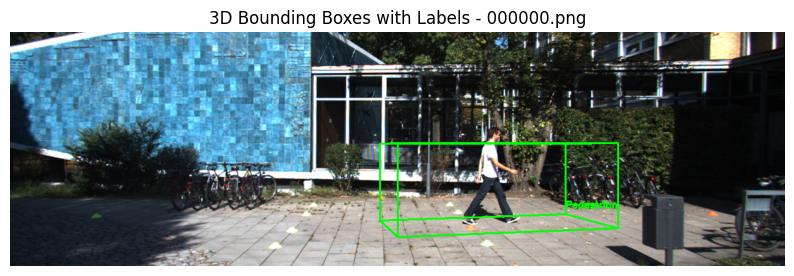

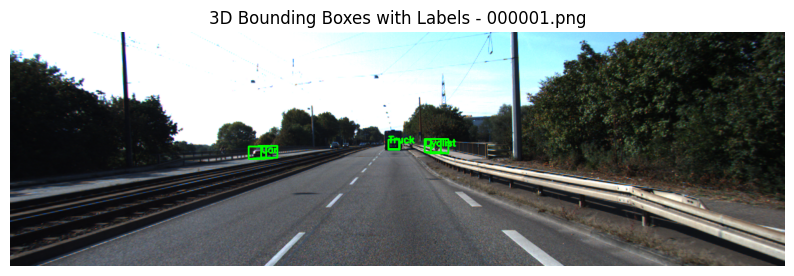

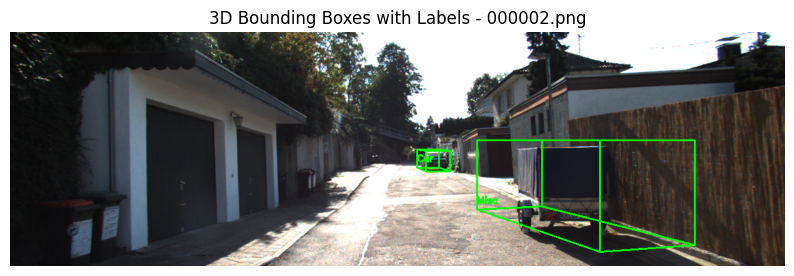

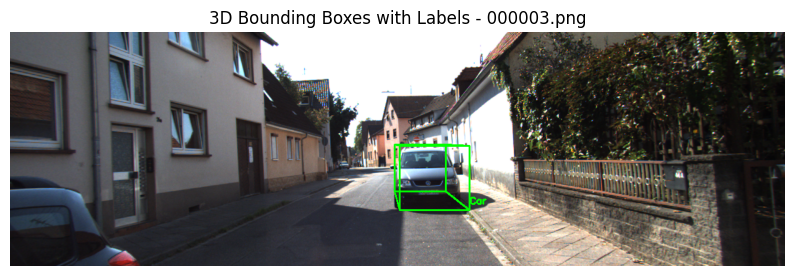

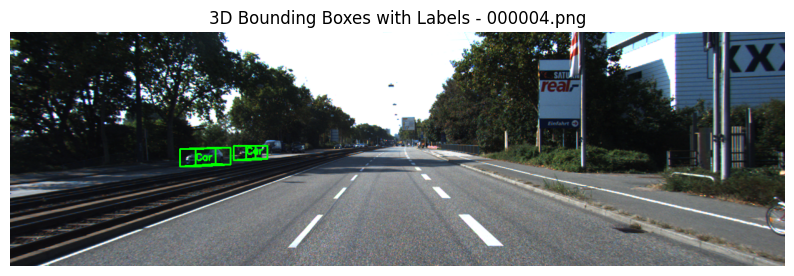

...

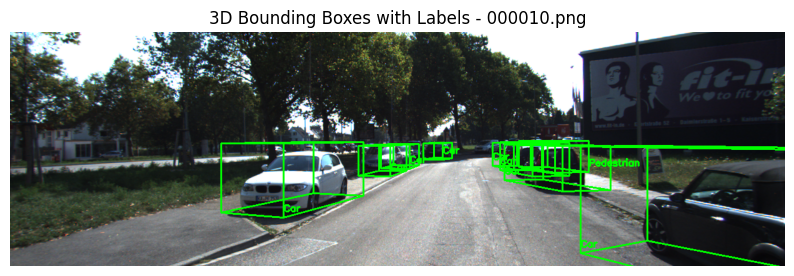

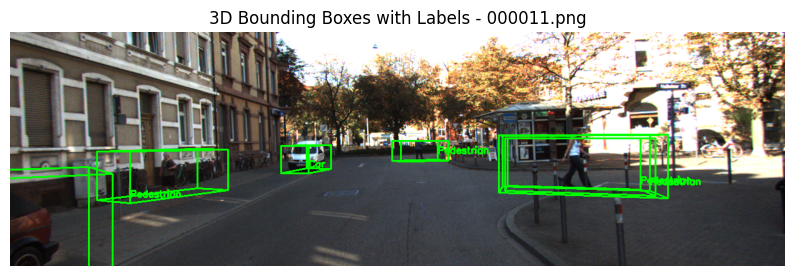

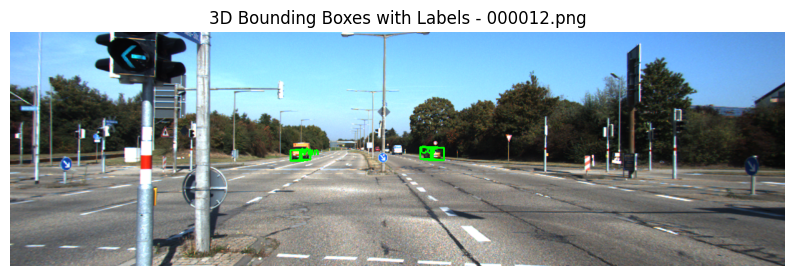

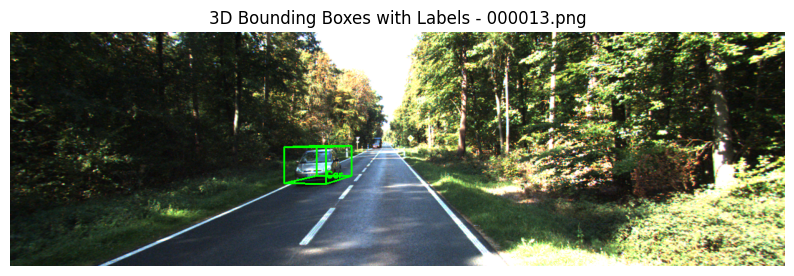

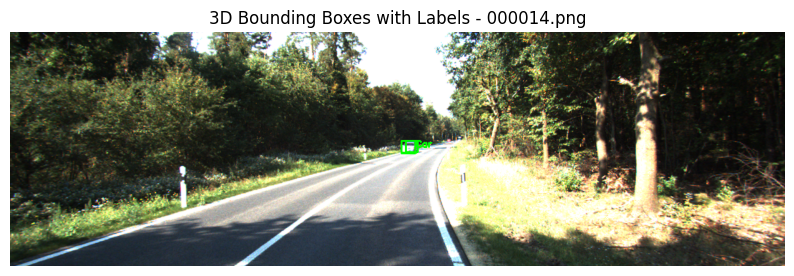

In [9]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Define directories
image_dir = 'training/image_2/'
box2d_loc = 'training/label_2/'
box3d_loc = 'training/box_3d/'
calib_loc = 'training/calib/'

# Ensure the output directory exists
os.makedirs(box3d_loc, exist_ok=True)

all_image = sorted(os.listdir(image_dir))[:15]

# Constants
NORM_H, NORM_W = 224, 224  # Normalized dimensions
BIN = 2  # Number of bins for angle prediction
dims_avg = {'Car': np.array([1.5, 1.7, 4.0])}  # Average dimensions for the "Car" class


def parse_calib_file(calib_file):
    """Parse calibration file to extract projection matrix."""
    with open(calib_file, 'r') as file:
        lines = file.readlines()
        for line in lines:
            if line.startswith('P2:'):  # Camera projection matrix P2
                values = line.strip().split(' ')[1:]
                projection_matrix = np.array(values, dtype=np.float32).reshape(3, 4)
                return projection_matrix
    return None


def compute_box_3d(dims, location, rotation_y):
    """Compute 3D bounding box corners."""
    h, w, l = dims
    x, y, z = location

    # Define 3D bounding box corners in object coordinates
    corners = np.array([
        [l / 2, 0, w / 2],
        [l / 2, 0, -w / 2],
        [-l / 2, 0, -w / 2],
        [-l / 2, 0, w / 2],
        [l / 2, -h, w / 2],
        [l / 2, -h, -w / 2],
        [-l / 2, -h, -w / 2],
        [-l / 2, -h, w / 2],
    ])

    # Apply rotation around Y-axis
    rotation_matrix = np.array([
        [np.cos(rotation_y), 0, np.sin(rotation_y)],
        [0, 1, 0],
        [-np.sin(rotation_y), 0, np.cos(rotation_y)],
    ])
    corners = np.dot(corners, rotation_matrix.T)

    # Translate the corners to the object's location
    corners += np.array([x, y, z])
    return corners


def project_to_image(corners_3d, proj_matrix):
    """Project 3D corners into 2D image space."""
    num_corners = corners_3d.shape[0]
    corners_3d_hom = np.hstack((corners_3d, np.ones((num_corners, 1))))
    corners_2d_hom = np.dot(proj_matrix, corners_3d_hom.T).T
    corners_2d = corners_2d_hom[:, :2] / corners_2d_hom[:, 2:]
    return corners_2d


# Iterate through the images
for f in all_image:
    image_file = image_dir + f
    box2d_file = box2d_loc + f.replace('png', 'txt')
    box3d_file = box3d_loc + f.replace('png', 'txt')
    calib_file = calib_loc + f.replace('png', 'txt')

    # Read the calibration file
    proj_matrix = parse_calib_file(calib_file)
    if proj_matrix is None:
        print(f"Missing or invalid calibration file: {calib_file}")
        continue

    # Read the image
    img = cv2.imread(image_file)
    img = img.astype(np.float32, copy=False)

    # Open a file to write the 3D bounding boxes
    with open(box3d_file, 'w') as box3d:
        # Read 2D bounding box file and process each line
        for line in open(box2d_file):
            line = line.strip().split(' ')
            obj_class = line[0]  # Object class (e.g., Car)
            truncated = np.abs(float(line[1]))
            occluded = np.abs(float(line[2]))
            rotation_y = float(line[3])

            # 2D bounding box
            obj = {
                'xmin': int(float(line[4])),
                'ymin': int(float(line[5])),
                'xmax': int(float(line[6])),
                'ymax': int(float(line[7])),
            }

            # Object location and dimensions
            location = np.array([float(line[11]), float(line[12]), float(line[13])])
            dims = dims_avg['Car'] + np.random.uniform(-0.1, 0.1, 3)  # Example

            # Compute 3D bounding box corners
            corners_3d = compute_box_3d(dims, location, rotation_y)

            # Project 3D corners to 2D
            corners_2d = project_to_image(corners_3d, proj_matrix)

            # Draw 3D bounding box
            for i in range(4):
                # Bottom rectangle
                cv2.line(img, tuple(corners_2d[i].astype(int)), tuple(corners_2d[(i + 1) % 4].astype(int)), (0, 255, 0), 2)
                # Top rectangle
                cv2.line(img, tuple(corners_2d[i + 4].astype(int)), tuple(corners_2d[(i + 1) % 4 + 4].astype(int)), (0, 255, 0), 2)
                # Vertical lines
                cv2.line(img, tuple(corners_2d[i].astype(int)), tuple(corners_2d[i + 4].astype(int)), (0, 255, 0), 2)

            # Display object label above the 3D bounding box
            label_pos = tuple(corners_2d[0].astype(int) - [0, 10])  # Position above the top-left corner
            cv2.putText(img, obj_class, label_pos, cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2, cv2.LINE_AA)

            # Write to the 3D bounding box file
            line = ' '.join([str(item) for item in line]) + '\n'
            box3d.write(line)

    # Display the image with 3D bounding boxes and labels
    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(img.astype(np.uint8), cv2.COLOR_BGR2RGB))
    plt.title(f"3D Bounding Boxes with Labels - {f}")
    plt.axis("off")
    plt.show()



1/1 [==============================] - 0s 355ms/step


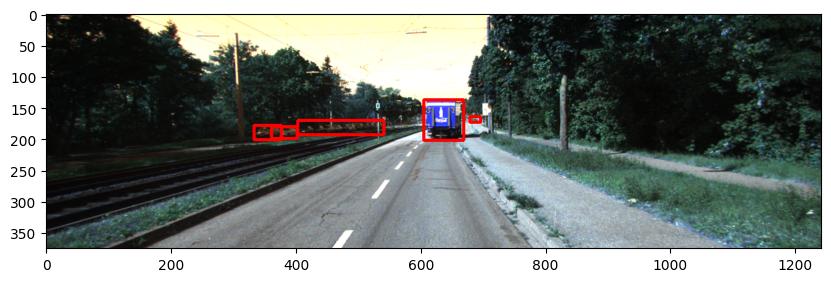

1/1 [==============================] - 0s 302ms/step


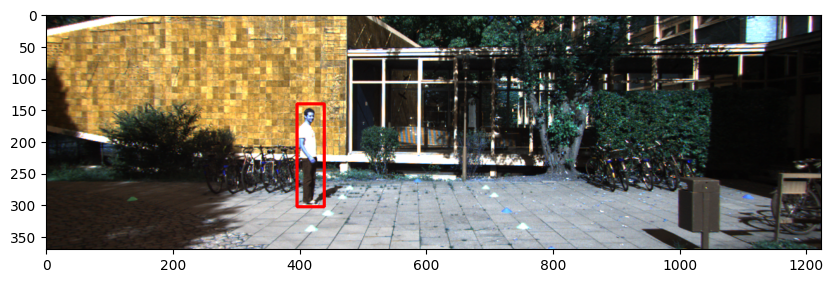

1/1 [==============================] - 0s 405ms/step


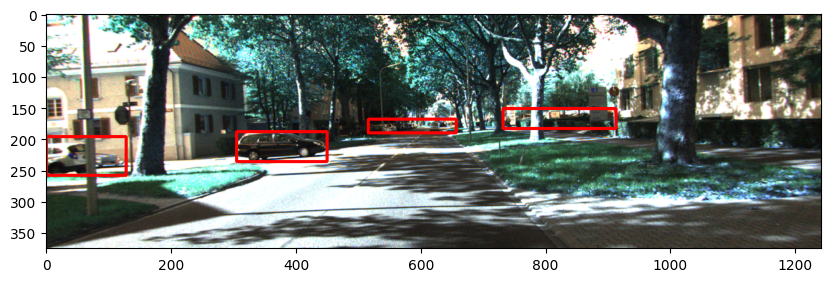

1/1 [==============================] - 0s 469ms/step


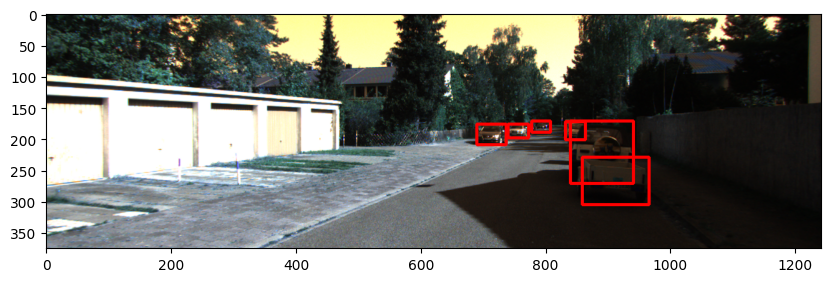

1/1 [==============================] - 0s 446ms/step


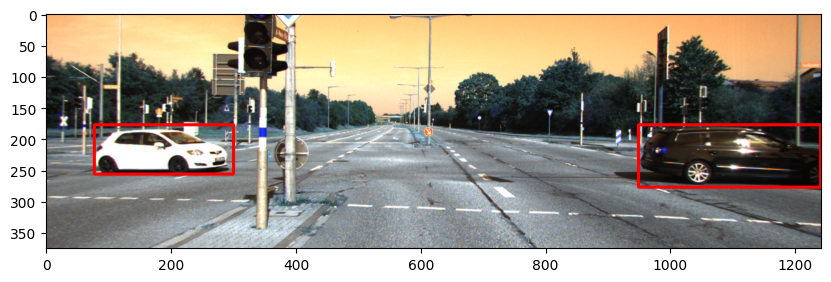

1/1 [==============================] - 0s 431ms/step


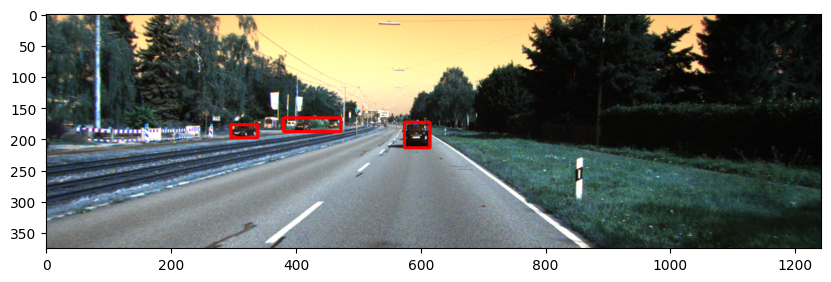

1/1 [==============================] - 0s 317ms/step


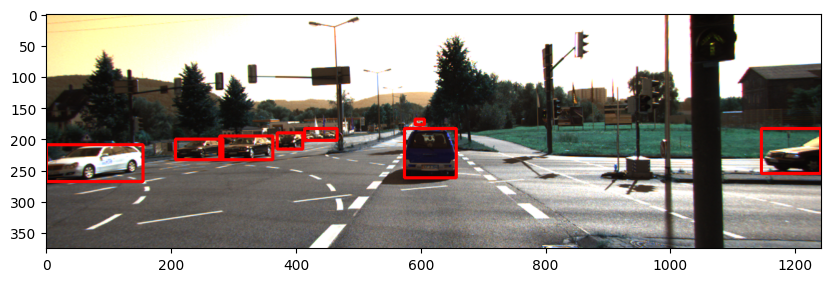

1/1 [==============================] - 0s 347ms/step


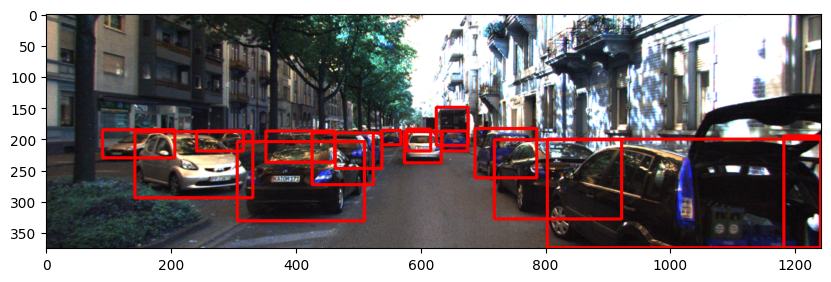

1/1 [==============================] - 0s 355ms/step


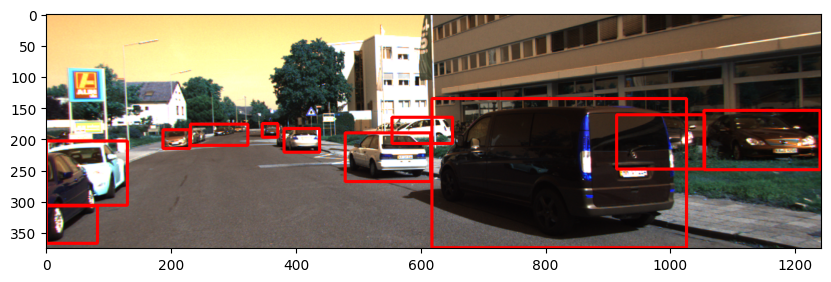

1/1 [==============================] - 0s 288ms/step


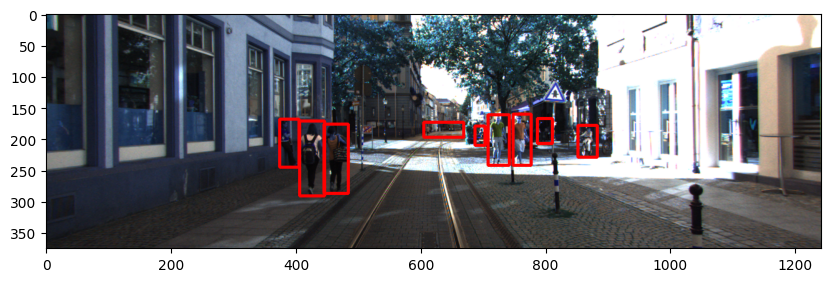

1/1 [==============================] - 0s 346ms/step


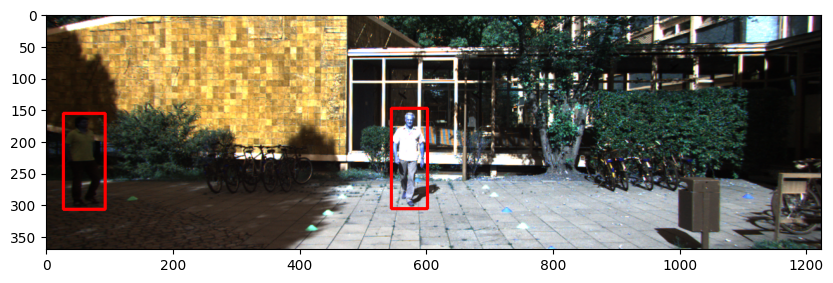

1/1 [==============================] - 0s 341ms/step


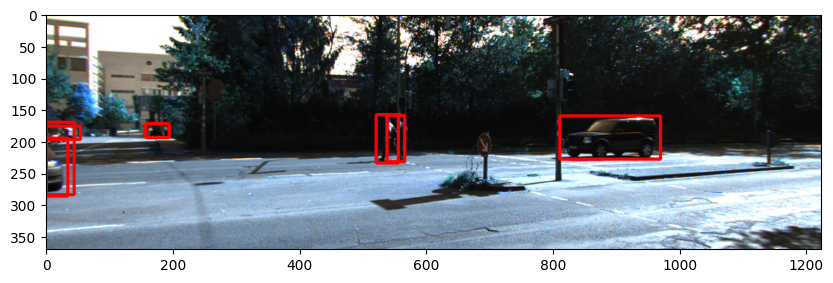

1/1 [==============================] - 0s 313ms/step


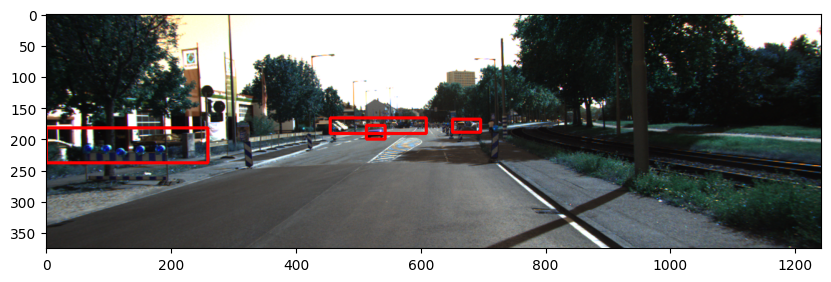

1/1 [==============================] - 0s 338ms/step


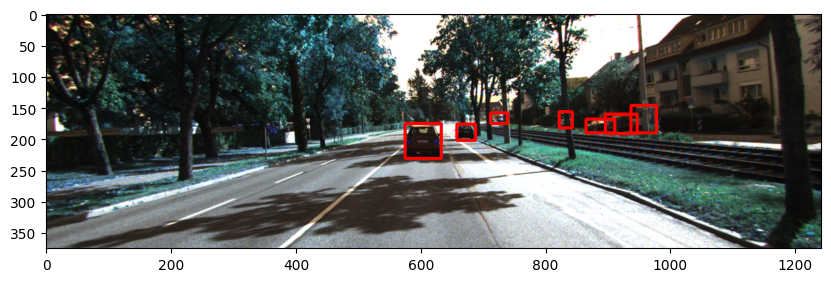

1/1 [==============================] - 0s 224ms/step


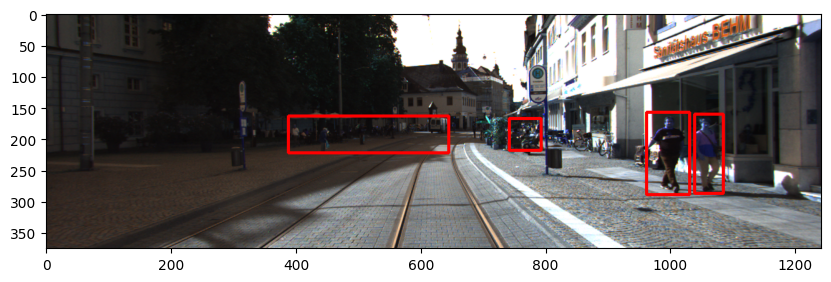

1/1 [==============================] - 0s 291ms/step


In [11]:
# image_dir = 'testing/image/'
# box2d_loc = 'testing/bbox_2d/'
# box3d_loc = 'testing/bbox_3d/'

# all_image = sorted(os.listdir(image_dir))
# #np.random.shuffle(all_image)

# for f in all_image:
#     image_file = image_dir + f
#     box2d_file = box2d_loc + f.replace('png', 'txt')
#     box3d_file = box3d_loc + f.replace('png', 'txt')
    
#     with open(box3d_file, 'w') as box3d:
#         img = cv2.imread(image_file)
#         img = img.astype(np.float32, copy=False)

#         for line in open(box2d_file):
#             line = line.strip().split(' ')
#             truncated = np.abs(float(line[1]))
#             occluded = np.abs(float(line[2]))

#             obj = {
#                 'xmin': int(float(line[4])),
#                 'ymin': int(float(line[5])),
#                 'xmax': int(float(line[6])),
#                 'ymax': int(float(line[7]))
#             }

#             # # Validate bounding box dimensions
#             # if obj['xmin'] >= obj['xmax'] or obj['ymin'] >= obj['ymax']:
#             #     print(f"Invalid bounding box: {obj}")
#             #     continue

#             # # Check if the bounding box is within the image dimensions
#             # img_height, img_width = img.shape[:2]
#             # if obj['xmin'] < 0 or obj['ymin'] < 0 or obj['xmax'] > img_width or obj['ymax'] > img_height:
#             #     print(f"Bounding box out of bounds: {obj}")
#             #     continue

#             patch = img[obj['ymin']:obj['ymax'], obj['xmin']:obj['xmax']]

#             # # Ensure patch is not empty
#             # if patch.size == 0:
#             #     print(f"Empty patch for bounding box: {obj}")
#             #     continue

#             patch = cv2.resize(patch, (NORM_H, NORM_W))
#             patch = patch - np.array([[[103.939, 116.779, 123.68]]])
#             patch = np.expand_dims(patch,0)


#             prediction = model.predict(patch)

#             # Transform regressed angle
#             max_anc = np.argmax(prediction[2][0])
#             anchors = prediction[1][0][max_anc]

#             if anchors[1] > 0:
#                 angle_offset = np.arccos(anchors[0])
#             else:
#                 angle_offset = -np.arccos(anchors[0])

#             wedge = 2. * np.pi / BIN
#             angle_offset = angle_offset + max_anc * wedge
#             angle_offset = angle_offset % (2. * np.pi)

#             angle_offset = angle_offset - np.pi / 2
#             if angle_offset > np.pi:
#                 angle_offset = angle_offset - (2. * np.pi)

#             line[3] = str(angle_offset)

#             # Transform regressed dimension
#             dims = dims_avg['Car'] + prediction[0][0]
#             line = line + list(dims)

#             # Write regressed 3D dim and oritent to file
#             line = ' '.join([str(item) for item in line]) + '\n'
#             box3d.write(line)
            
#             cv2.rectangle(img, (obj['xmin'],obj['ymin']), (obj['xmax'],obj['ymax']), (255,0,0), 3)
    
#     plt.figure(figsize=(10,10))
#     plt.imshow(img/255.)
#     plt.show()

image_dir = 'testing/image/'
box2d_loc = 'testing/bbox_2d/'
box3d_loc = 'testing/bbox_3d/'

all_image = sorted(os.listdir(image_dir))
# np.random.shuffle(all_image)

# Limit display to the first 15 images
display_limit = 15
processed_count = 0

for f in all_image:
    image_file = image_dir + f
    box2d_file = box2d_loc + f.replace('png', 'txt')
    box3d_file = box3d_loc + f.replace('png', 'txt')
    
    with open(box3d_file, 'w') as box3d:
        img = cv2.imread(image_file)
        img = img.astype(np.float32, copy=False)

        for line in open(box2d_file):
            line = line.strip().split(' ')
            truncated = np.abs(float(line[1]))
            occluded = np.abs(float(line[2]))

            obj = {
                'xmin': int(float(line[4])),
                'ymin': int(float(line[5])),
                'xmax': int(float(line[6])),
                'ymax': int(float(line[7]))
            }

            patch = img[obj['ymin']:obj['ymax'], obj['xmin']:obj['xmax']]
            patch = cv2.resize(patch, (NORM_H, NORM_W))
            patch = patch - np.array([[[103.939, 116.779, 123.68]]])
            patch = np.expand_dims(patch, 0)

            prediction = model.predict(patch)

            # Transform regressed angle
            max_anc = np.argmax(prediction[2][0])
            anchors = prediction[1][0][max_anc]

            if anchors[1] > 0:
                angle_offset = np.arccos(anchors[0])
            else:
                angle_offset = -np.arccos(anchors[0])

            wedge = 2. * np.pi / BIN
            angle_offset = angle_offset + max_anc * wedge
            angle_offset = angle_offset % (2. * np.pi)

            angle_offset = angle_offset - np.pi / 2
            if angle_offset > np.pi:
                angle_offset = angle_offset - (2. * np.pi)

            line[3] = str(angle_offset)

            # Transform regressed dimension
            dims = dims_avg['Car'] + prediction[0][0]
            line = line + list(dims)

            # Write regressed 3D dim and orientation to file
            line = ' '.join([str(item) for item in line]) + '\n'
            box3d.write(line)
            
            cv2.rectangle(img, (obj['xmin'], obj['ymin']), (obj['xmax'], obj['ymax']), (255, 0, 0), 3)

    if processed_count < display_limit:
        plt.figure(figsize=(10, 10))
        plt.imshow(img / 255.)
        
        plt.show()

    processed_count += 1

    